In [1]:
# install.packages("tidyverse")
# install.packages("tidymodels")
# install.packages("leaps") # Run this once if you do not have the package
# install.packages("car")
library(leaps)
library(tidyverse)
library(tidymodels)
library(broom)
# library(car)

data <- read.csv("listings.csv", header = TRUE) %>%
  select(-id, -name, -host_id, -host_name, -host_since, -neighbourhood_cleansed, -property_type, -license, -latitude, -longitude,-host_response_time)
data <- na.omit(data)
data <- data %>%
  filter(beds != 0)

listings <- data %>%
  mutate(host_response_rate = as.numeric(host_response_rate), 
         host_is_superhost = as.factor(host_is_superhost), 
         neighbourhood_group_cleansed = as.factor(neighbourhood_group_cleansed), 
         room_type = as.factor(room_type),
         instant_bookable = as.factor(instant_bookable))
head(listings)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.2.0 ──

✔ broom        1.0.5     ✔ rsample      1.2.1
✔ dials        1.3.0     ✔ tune         1.2.1
✔ infer        1.0.7     ✔ workflows    1.1.4
✔ modeldata    1.4.0     ✔ workflowsets 1.1.0
✔ parsnip      1.2.1     ✔ yardstick    1.3.1
✔ recipes      1.1.0     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

,host_response_rate,host_is_superhost,neighbourhood_group_cleansed,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,availability_365,number_of_reviews,review_scores_rating,instant_bookable
,<dbl>,<fct>,<fct>,<fct>,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<fct>
1,0.2,f,Other Cities,Private room,2,1.0,1,1,49,1,364,1,3.00,f
2,1.0,t,Other Cities,Entire home/apt,2,1.0,0,1,231,5,193,44,4.93,t
3,1.0,f,City of Los Angeles,Entire home/apt,7,1.0,2,5,110,30,117,368,4.61,f
4,1.0,t,City of Los Angeles,Entire home/apt,6,3.5,4,4,1179,2,356,35,4.97,f
5,1.0,t,City of Los Angeles,Entire home/apt,8,4.5,4,4,1244,3,141,10,5.00,f
6,1.0,t,Other Cities,Entire home/apt,5,1.0,2,3,213,2,244,23,4.74,t


In [2]:
R.Version()

$platform
[1] "aarch64-apple-darwin20.0.0"

$arch
[1] "aarch64"

$os
[1] "darwin20.0.0"

$system
[1] "aarch64, darwin20.0.0"

$status
[1] ""

$major
[1] "4"

$minor
[1] "3.2"

$year
[1] "2023"

$month
[1] "10"

$day
[1] "31"

$`svn rev`
[1] "85441"

$language
[1] "R"

$version.string
[1] "R version 4.3.2 (2023-10-31)"

$nickname
[1] "Eye Holes"

In [3]:
full <- lm(listings$price ~ ., data = listings)
summary(full)


Call:
lm(formula = listings$price ~ ., data = listings)

Residuals:
    Min      1Q  Median      3Q     Max 
-6706.5   -81.5   -14.8    38.3 15674.5 

Coefficients:
                                                   Estimate Std. Error t value
(Intercept)                                      -172.51884   33.89633  -5.090
host_response_rate                                -65.81709   17.34827  -3.794
host_is_superhostf                                 34.47646   12.14489   2.839
host_is_superhostt                                 28.56724   12.04055   2.373
neighbourhood_group_cleansedOther Cities            1.43780    4.92541   0.292
neighbourhood_group_cleansedUnincorporated Areas  -33.73329    7.50066  -4.497
room_typeHotel room                               868.86232   50.04096  17.363
room_typePrivate room                             -78.63469    6.05385 -12.989
room_typeShared room                             -204.55346   26.07226  -7.846
accommodates                                

In [4]:
full_log <- lm(log(listings$price) ~ ., data = listings)
summary(full_log)


Call:
lm(formula = log(listings$price) ~ ., data = listings)

Residuals:
     Min       1Q   Median       3Q      Max 
-10.6591  -0.3168  -0.0555   0.2550   5.0182 

Coefficients:
                                                   Estimate Std. Error t value
(Intercept)                                       4.063e+00  4.895e-02  83.014
host_response_rate                               -1.069e-01  2.505e-02  -4.267
host_is_superhostf                                8.555e-02  1.754e-02   4.878
host_is_superhostt                                9.929e-02  1.739e-02   5.710
neighbourhood_group_cleansedOther Cities         -4.581e-02  7.112e-03  -6.441
neighbourhood_group_cleansedUnincorporated Areas -1.503e-01  1.083e-02 -13.881
room_typeHotel room                               7.780e-01  7.226e-02  10.766
room_typePrivate room                            -6.557e-01  8.742e-03 -75.011
room_typeShared room                             -1.456e+00  3.765e-02 -38.675
accommodates                 

In [5]:
vif(full_log)

ERROR: Error in vif(full_log): could not find function "vif"


We see no multicollinearity concern

In [6]:
subset_sel <- regsubsets(log(price) ~., data=listings, nvmax=18, method="exhaustive")
ss <- summary(subset_sel)
ss$which
ss$rsq
ss$adjr2
ss$cp
p=rowSums(ss$which)-1
p
png("cp_plot.png", width = 1000, height = 1000)
plot(p,ss$cp)
text(x = p, y = ss$cp, 
     labels = paste0("(", p, ", ", round(ss$cp, 2), ")"), 
     pos = 4, cex = 0.8, col = "blue")
abline(a=1,b=1)
dev.off()

,(Intercept),host_response_rate,host_is_superhostf,host_is_superhostt,neighbourhood_group_cleansedOther Cities,neighbourhood_group_cleansedUnincorporated Areas,room_typeHotel room,room_typePrivate room,room_typeShared room,accommodates,bathrooms,bedrooms,beds,minimum_nights,availability_365,number_of_reviews,review_scores_rating,instant_bookablet
1,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
2,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
3,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
4,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
5,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
6,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE
7,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE
8,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,TRUE,FALSE
9,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,TRUE,FALSE
10,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,TRUE,FALSE


[1] 0.4483253 0.5233155 0.5537251 0.5744681 0.5855483 0.5923061 0.5959982
 [8] 0.5993491 0.6019195 0.6037348 0.6044175 0.6048564 0.6051082 0.6053404
[15] 0.6056209 0.6056322 0.6056388

[1] 0.4483036 0.5232779 0.5536723 0.5744010 0.5854666 0.5922097 0.5958867
 [8] 0.5992227 0.6017782 0.6035785 0.6042459 0.6046693 0.6049057 0.6051225
[15] 0.6053876 0.6053833 0.6053744

[1] 10098.29737  5279.83816  3327.07383  1995.69242  1285.43920   853.04024
 [7]   617.71231   404.30810   241.08181   126.39126    84.50530    58.29778
[13]    44.11067    31.18045    15.14969    16.42821    18.00000

1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 
 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17

pdf 
  2

Model with 10 covariates gives a near maximum adjusted R squared and its Cp is close to 11, so we choose it over the other ones using also the principle of parsimony.

Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_text()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_text()`).”


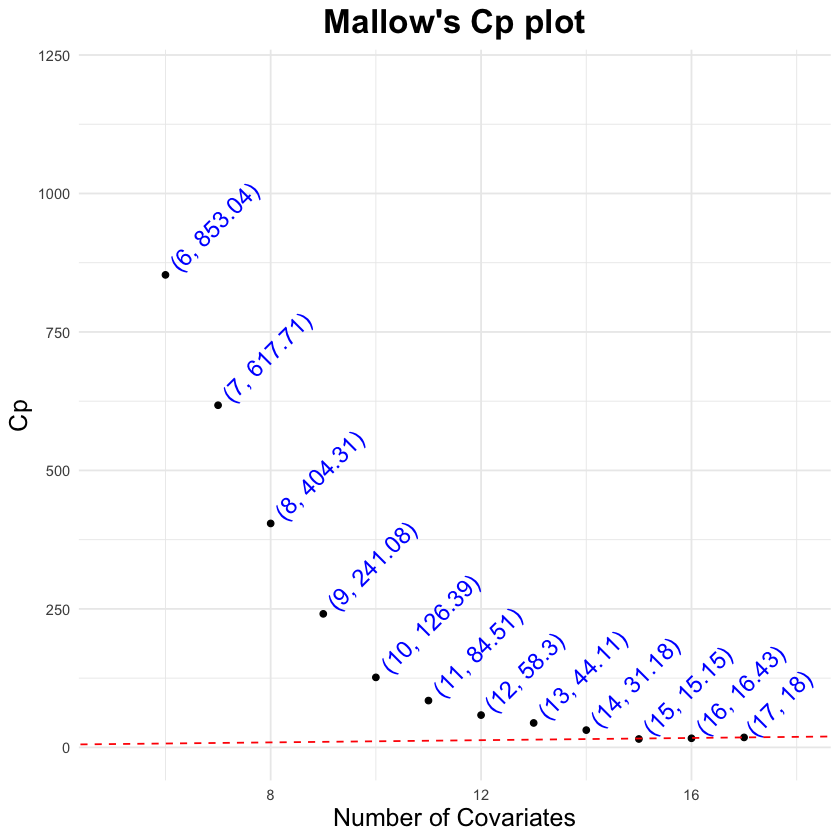

In [42]:
data_cp <- data.frame(
  p = p,
  cp = ss$cp
)

# Plot using ggplot2
cp_plot <- ggplot(data_cp, aes(x = p, y = cp)) +
  geom_point() +  # Points
  geom_text(aes(label = paste0("(", p, ", ", round(cp, 2), ")")), 
            hjust = -0.1, vjust = 0.5,angle = 45,  color = "blue", size = 5) +  # Text labels
  geom_abline(intercept = 1, slope = 1, linetype = "dashed", color = "red") +  # Reference line
  labs(
    title = "Mallow's Cp plot",
    x = "Number of Covariates",
    y = "Cp"
  ) +
  theme_minimal() +
  xlim(c(5, 18)) +
  ylim(c(0, 1200)) +
  theme(plot.title = element_text(size = 20,face = "bold", hjust = 0.5),
    axis.title = element_text(size = 15))


ggsave("plots/Cp.png", plot = cp_plot, width = 20, height = 20, units = "in", dpi = 600)
cp_plot


In [7]:
ss$adjr2[10]
ss$which[10,]

[1] 0.6035785

(Intercept) 
                                            TRUE 
                              host_response_rate 
                                           FALSE 
                              host_is_superhostf 
                                           FALSE 
                              host_is_superhostt 
                                           FALSE 
        neighbourhood_group_cleansedOther Cities 
                                           FALSE 
neighbourhood_group_cleansedUnincorporated Areas 
                                            TRUE 
                             room_typeHotel room 
                                            TRUE 
                           room_typePrivate room 
                                            TRUE 
                            room_typeShared room 
                                            TRUE 
                                    accommodates 
                                            TRUE 
                                       bathrooms 
                                            TRUE 
                                        bedrooms 
                                            TRUE 
                                            beds 
                                            TRUE 
                                  minimum_nights 
                                            TRUE 
                                availability_365 
                                           FALSE 
                               number_of_reviews 
                                           FALSE 
                            review_scores_rating 
                                            TRUE 
                               instant_bookablet 
                                           FALSE

In [8]:
best_model_covariates=as_tibble(
        as.matrix(ss$which[10,]),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & V1 !=FALSE) %>% 
        pull(covariate)
best_model_covariates

Warning message:
“The `x` argument of `as_tibble.matrix()` must have unique column names if
`.name_repair` is omitted as of tibble 2.0.0.
ℹ Using compatibility `.name_repair`.”


[1] "neighbourhood_group_cleansedUnincorporated Areas"
 [2] "room_typeHotel room"                             
 [3] "room_typePrivate room"                           
 [4] "room_typeShared room"                            
 [5] "accommodates"                                    
 [6] "bathrooms"                                       
 [7] "bedrooms"                                        
 [8] "beds"                                            
 [9] "minimum_nights"                                  
[10] "review_scores_rating"

In [9]:
levels(listings$neighbourhood_group_cleansed)

[1] "City of Los Angeles"  "Other Cities"         "Unincorporated Areas"

The model selection selected only one level of `neighbourhood_group_cleansed`, which has 3 levels, so we should join the level which is not selected with the baseline

In [10]:
listings_joined=listings %>% mutate(neighbourhood_group_cleansed=fct_collapse(neighbourhood_group_cleansed,OthersAndLosAngeles=c("City of Los Angeles","Other Cities")))
head(listings_joined)

,host_response_rate,host_is_superhost,neighbourhood_group_cleansed,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,availability_365,number_of_reviews,review_scores_rating,instant_bookable
,<dbl>,<fct>,<fct>,<fct>,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<fct>
1,0.2,f,OthersAndLosAngeles,Private room,2,1.0,1,1,49,1,364,1,3.00,f
2,1.0,t,OthersAndLosAngeles,Entire home/apt,2,1.0,0,1,231,5,193,44,4.93,t
3,1.0,f,OthersAndLosAngeles,Entire home/apt,7,1.0,2,5,110,30,117,368,4.61,f
4,1.0,t,OthersAndLosAngeles,Entire home/apt,6,3.5,4,4,1179,2,356,35,4.97,f
5,1.0,t,OthersAndLosAngeles,Entire home/apt,8,4.5,4,4,1244,3,141,10,5.00,f
6,1.0,t,OthersAndLosAngeles,Entire home/apt,5,1.0,2,3,213,2,244,23,4.74,t


In [11]:
best_model_covariates

[1] "neighbourhood_group_cleansedUnincorporated Areas"
 [2] "room_typeHotel room"                             
 [3] "room_typePrivate room"                           
 [4] "room_typeShared room"                            
 [5] "accommodates"                                    
 [6] "bathrooms"                                       
 [7] "bedrooms"                                        
 [8] "beds"                                            
 [9] "minimum_nights"                                  
[10] "review_scores_rating"

In [15]:
best_model=lm(log(price)~neighbourhood_group_cleansed+room_type+accommodates+bathrooms+bedrooms+beds+minimum_nights+review_scores_rating,data=listings_joined)
summary(best_model) %>% tidy(conf.int = TRUE) %>% mutate_if(is.numeric, round, 2)

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),4.02,0.04,106.36,0,3.95,4.09
neighbourhood_group_cleansedUnincorporated Areas,-0.12,0.01,-12.20,0,-0.14,-0.10
room_typeHotel room,0.76,0.07,10.34,0,0.62,0.91
room_typePrivate room,-0.63,0.01,-73.41,0,-0.64,-0.61
room_typeShared room,-1.41,0.04,-37.94,0,-1.48,-1.33
accommodates,0.08,0.00,34.88,0,0.08,0.08
bathrooms,0.13,0.00,30.17,0,0.12,0.14
bedrooms,0.16,0.01,30.75,0,0.15,0.16
beds,-0.05,0.00,-14.58,0,-0.06,-0.04


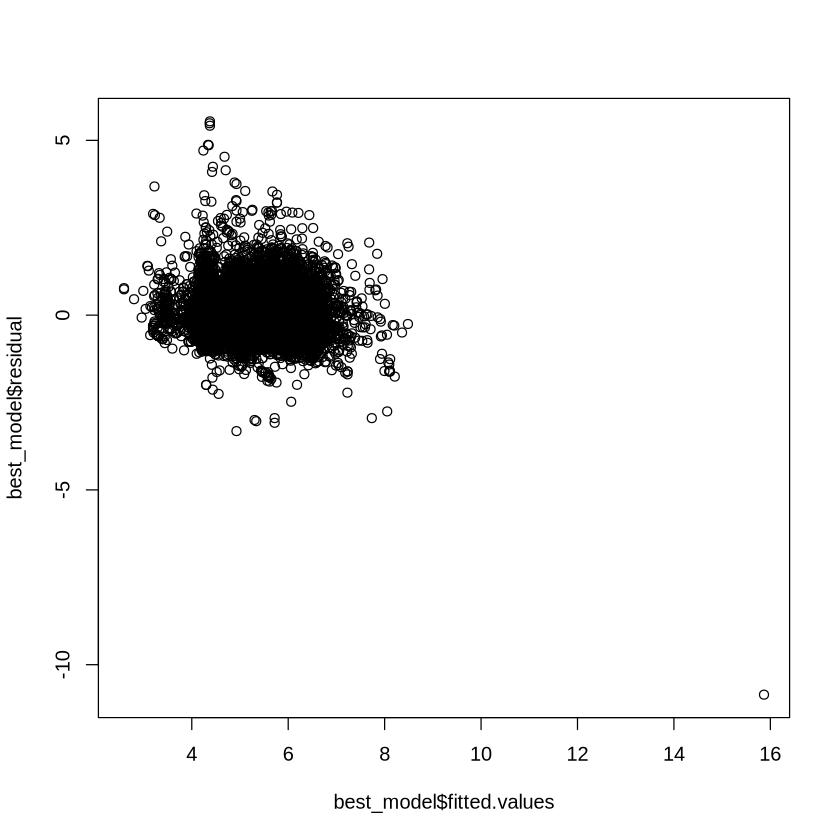

In [ ]:
plot(best_model$fitted.values,best_model$residual)

We see one possible outlier, lets check standarised residuals

In [16]:
res_stand=best_model$residual/(summary(best_model)$sigma*sqrt(1-hatvalues(best_model)))
print(max(abs(res_stand)))
print(which.max(abs(res_stand)))
listings[which.max(abs(res_stand)),]

[1] 23.64202
13744 
13744 


,host_response_rate,host_is_superhost,neighbourhood_group_cleansed,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,availability_365,number_of_reviews,review_scores_rating,instant_bookable
,<dbl>,<fct>,<fct>,<fct>,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<fct>
13744,1,f,Other Cities,Private room,4,50,50,50,150,1,270,3,3.67,t


This is a very unlikely data point, as it has many bathrooms and bedrooms and beds and the price is so low, so we will drop it, refit the model and check the fitted vs residuals plot

In [17]:
listings_joined=listings_joined[-which.max(abs(res_stand)),]

In [27]:
best_model=lm(log(price)~neighbourhood_group_cleansed+room_type+accommodates+bathrooms+bedrooms+beds+minimum_nights+review_scores_rating,data=listings_joined)
summary(best_model)
png("plots/residuals.png", height = 500, width = 500, res=150)
plot(best_model$fitted.values,best_model$residual, main = "Residuals VS. Fitted Values",
    xlab = "Fitted Values", ylab = "Residuals")
abline(a=0, b=0, col = "red")
dev.off()


Call:
lm(formula = log(price) ~ neighbourhood_group_cleansed + room_type + 
    accommodates + bathrooms + bedrooms + beds + minimum_nights + 
    review_scores_rating, data = listings_joined)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.5180 -0.3240 -0.0590  0.2601  5.5525 

Coefficients:
                                                   Estimate Std. Error t value
(Intercept)                                       4.0391556  0.0374208  107.94
neighbourhood_group_cleansedUnincorporated Areas -0.1199660  0.0098650  -12.16
room_typeHotel room                               0.7651895  0.0731274   10.46
room_typePrivate room                            -0.6385423  0.0084662  -75.42
room_typeShared room                             -1.4817579  0.0368404  -40.22
accommodates                                      0.0580273  0.0024495   23.69
bathrooms                                         0.1477191  0.0042806   34.51
bedrooms                                          0.1813242  0.00

pdf 
  2

We see no pattern on the data

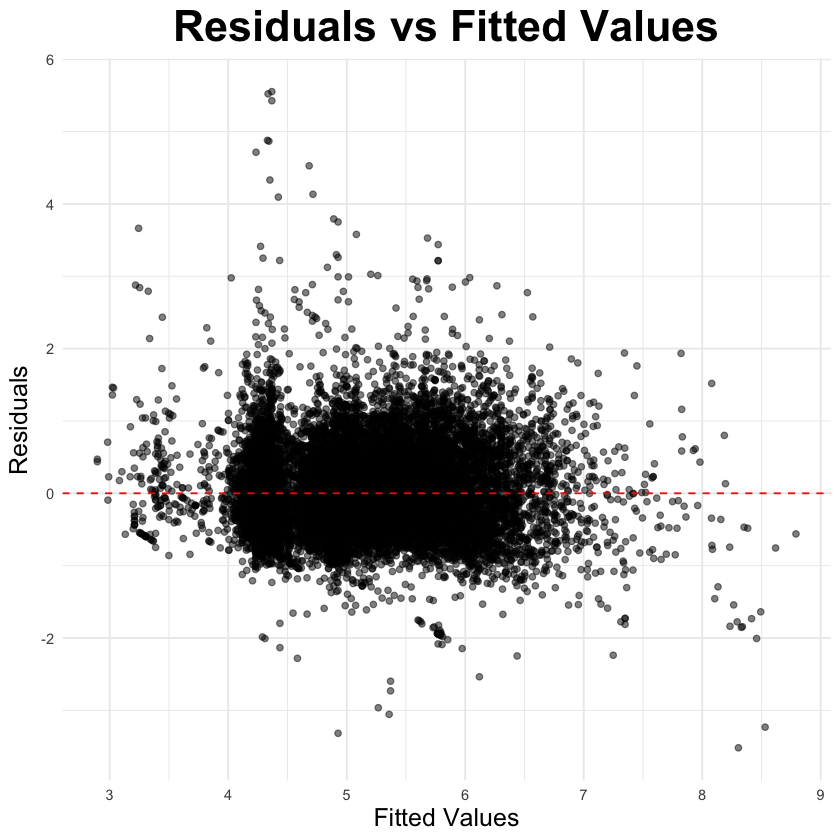

In [32]:
residuals_df <- data.frame(
    Fitted = fitted(best_model),
    Residuals = residuals(best_model)
)

resid_plot <- ggplot(residuals_df, aes(x = Fitted, y = Residuals)) +
  geom_point(color = "black", alpha = 0.5) +  # Scatter plot
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +  # Reference line at y = 0
  labs(
    title = "Residuals vs Fitted Values",
    x = "Fitted Values",
    y = "Residuals"
  ) +
  theme_minimal() +
  theme(plot.title = element_text(size = 26,face = "bold", hjust = 0.5),
    axis.title = element_text(size = 15))

ggsave("plots/resid.png", plot = resid_plot, width = 10, height = 10, units = "in", dpi = 600)
resid_plot

In [ ]:
vif(best_model)

ERROR: Error in vif(best_model): could not find function "vif"
